In [72]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [73]:
from virtart.object_detector import ObjectDetector
from PIL import Image
import numpy as np
from virtart.segment import Segmentor
import warnings

warnings.filterwarnings('ignore')
object_detector = ObjectDetector(device='gpu')
sam = Segmentor()

Loading checkpoint from checkpoints/yolov6n.pt

Fusing model...


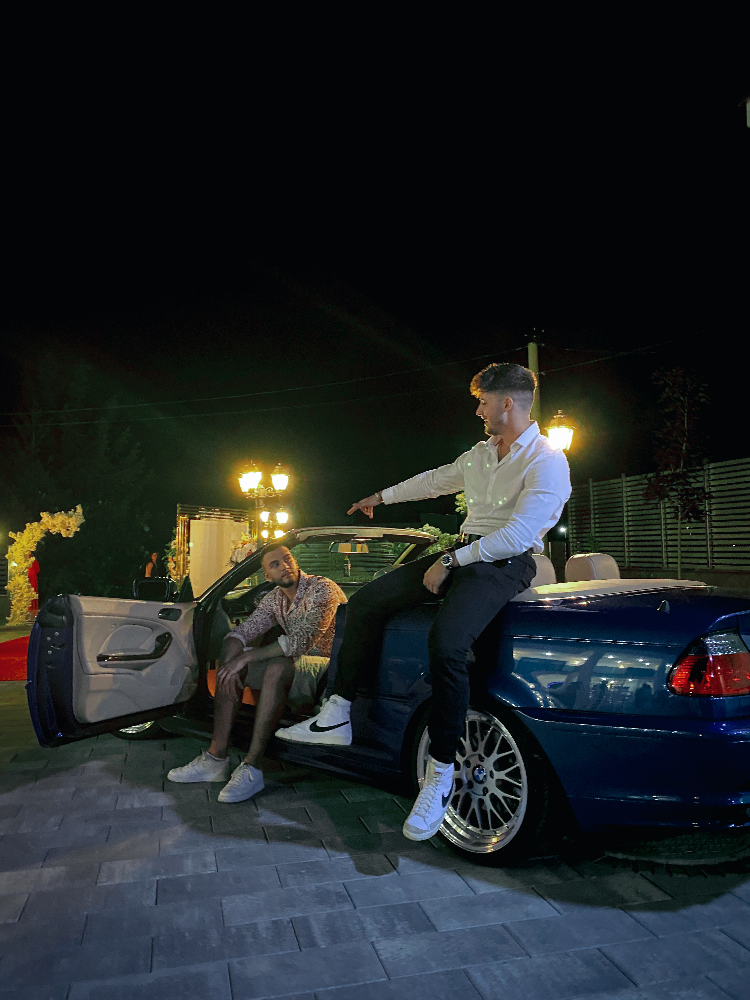

In [74]:
img = Image.open('imgs/image1.jpg')
img_numpy = np.array(img)
img

In [75]:
import matplotlib.pyplot as plt

detections = object_detector(img_numpy)
person_bboxes = [detection['bbox'] for detection in detections if detection['class'] == 'person']
masks = sam(img_numpy, person_bboxes)



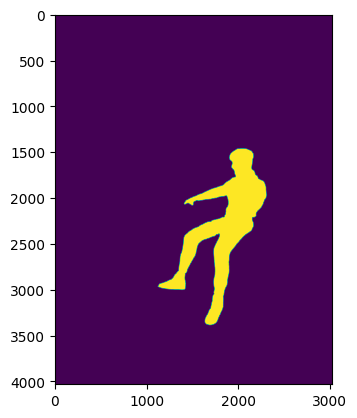

In [76]:
plt.imshow(masks[0])

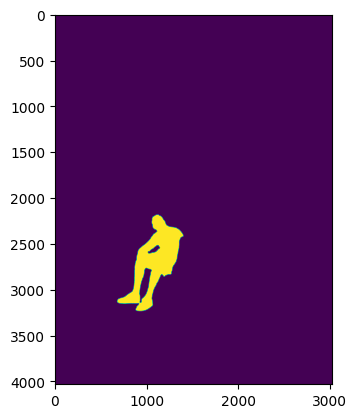

In [77]:
plt.imshow(masks[1])

In [78]:
plt.imsave('imgs/image1_sam_mask_1.png', masks[0], cmap='gray')
plt.imsave('imgs/image1_sam_mask_2.png', masks[1], cmap='gray')

In [79]:
from PIL import Image
import numpy as np

# Load SAM-generated mask
sam_mask_image1 = Image.open('imgs/image1_sam_mask_1.png')
if sam_mask_image1.mode == 'RGBA':
    sam_mask_image1 = sam_mask_image1.convert('RGB')
sam_mask_np1 = np.array(sam_mask_image1)

# Load ground truth mask (self created)
groundT_mask_image1 = Image.open('imgs/image1_binary.jpg')
groundT_mask_np1 = np.array(groundT_mask_image1)

sam_mask_image2 = Image.open('imgs/image1_sam_mask_2.png')
if sam_mask_image2.mode == 'RGBA':
    sam_mask_image2 = sam_mask_image2.convert('RGB')
sam_mask_np2 = np.array(sam_mask_image2)

groundT_mask_image2 = Image.open('imgs/image1_binary2.jpg')
groundT_mask_np2 = np.array(groundT_mask_image2)



In [80]:
def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1 == 255, mask2 == 255)
    union = np.logical_or(mask1 == 255, mask2 == 255)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score


# IoU score:
The following value is the IoU score of comparing the ground truth masks (self created) with the masks created by SAM.
For this instance we compare how well the 2 persons in the image are recognised.

In [81]:
iou_score1 = calculate_iou(sam_mask_np1, groundT_mask_np1)
iou_score2 = calculate_iou(sam_mask_np2, groundT_mask_np2)
print("IoU score:", (iou_score1 + iou_score2) / 2)

IoU score: 0.9389369809700119


# Another image

In [82]:
object_detector = ObjectDetector(device='gpu')
sam = Segmentor()

Loading checkpoint from checkpoints/yolov6n.pt

Fusing model...


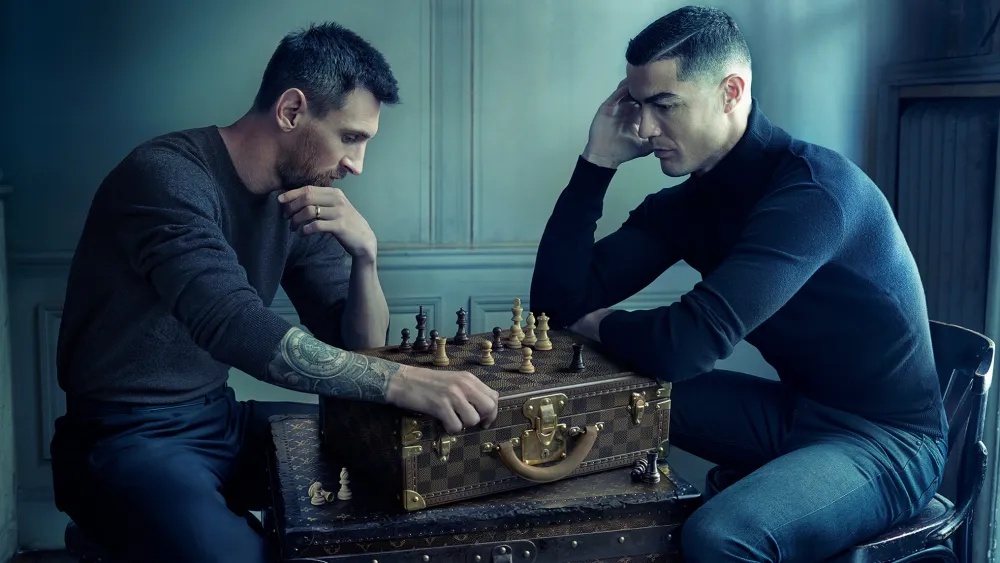

In [83]:
img = Image.open('imgs/CR7_Messi.jpg')
img_numpy = np.array(img)
img

In [84]:
detections = object_detector(img_numpy)
person_bboxes = [detection['bbox'] for detection in detections if detection['class'] == 'person']
masks = sam(img_numpy, person_bboxes)

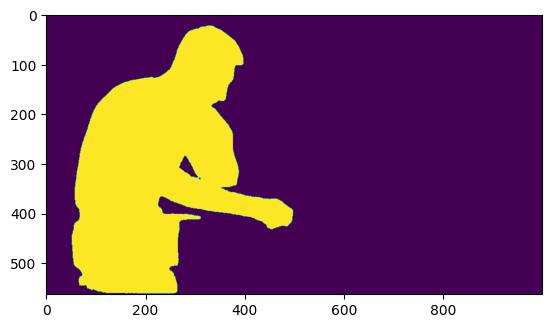

In [85]:
plt.imshow(masks[0])

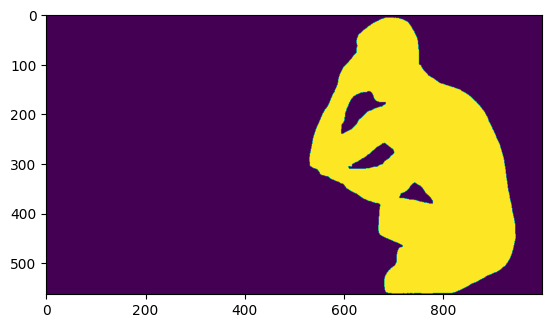

In [86]:
plt.imshow(masks[1])

In [87]:
plt.imsave('imgs/CR7_Messi_sam_mask1.png', masks[1], cmap='gray')
plt.imsave('imgs/CR7_Messi_sam_mask2.png', masks[0], cmap='gray')

In [88]:
sam_mask_image1 = Image.open('imgs/CR7_Messi_sam_mask1.png')

if sam_mask_image1.mode == 'RGBA':
    sam_mask_image1 = sam_mask_image1.convert('RGB')
sam_mask_np1 = np.array(sam_mask_image1)

# Load ground truth mask (self created)
groundT_mask_image1 = Image.open('imgs/CR7_binary.jpg')
groundT_mask_np1 = np.array(groundT_mask_image1)

sam_mask_image2 = Image.open('imgs/CR7_Messi_sam_mask2.png')
if sam_mask_image2.mode == 'RGBA':
    sam_mask_image2 = sam_mask_image2.convert('RGB')
sam_mask_np2 = np.array(sam_mask_image2)

groundT_mask_image2 = Image.open('imgs/Messi_binary.jpg')
groundT_mask_np2 = np.array(groundT_mask_image2)

In [89]:
iou_score1 = calculate_iou(sam_mask_np1, groundT_mask_np1)
iou_score2 = calculate_iou(sam_mask_np2, groundT_mask_np2)
print("IoU score:", (iou_score1 + iou_score2) / 2)

IoU score: 0.9522580440857695
